# Исследование рынка заведений общественного питания Москвы

# Описание проекта

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. На основе имеющихся данных необходимо провести исследование рынка заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты заказчику (инвесторам из фонда «Shut Up and Take My Money»), которые в будущем помогут в выборе подходящего инвесторам места. 

# Описание данных
Файл moscow_places.csv:
* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    * «Средний счёт: 1000–1500 ₽»;
    * «Цена чашки капучино: 130–220 ₽»;
    * «Цена бокала пива: 400–600 ₽» и так далее;
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.


# Содержание:

1. Изучение общей информации
2. Предобработка данных
3. Анализ данных
4. Детализация исследования: открытие кофейни
5. Подготовка презентации

## Изучение общей информации

In [1]:
# импортируем библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from plotly import graph_objects as go
import plotly.express as px
import copy
import folium
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
pip install plotly==5.5.0

     |████████████████████████████████| 26.5 MB 135 kB/s  eta 0:00:01
  Attempting uninstall: plotly
    Found existing installation: plotly 5.4.0
    Uninstalling plotly-5.4.0:
      Successfully uninstalled plotly-5.4.0
Note: you may need to restart the kernel to use updated packages.


In [3]:
# загрузим данные в переменную и прочитаем их
df = pd.read_csv('/datasets/moscow_places.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
# рассмотрим какие заведения общественного питания есть в датасете
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [5]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Изучив информацию о датасете, видим, что столбцы названы в соответствии с хорошим стилем, у всех корректный тип данных, но  присутствуют пропуски в даных.  В датасете представлены заведения 8 типов 'кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб','быстрое питание', 'булочная', 'столовая'; всего 8406 заведений. 

## Предобработка данных

### Проверим есть ли в данных дубликаты

In [6]:
df.duplicated().sum()

0

Дубликатов нет.

### Избавимся от пропусков

In [7]:
# посчитаем пропуски в датасете
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [8]:
# заменим пропуски в столбце hours на 0 и посмотрим на данные
df['hours'] = df['hours'].fillna(0)
# посмотрим в каких заведениях есть пропуски по времени работы
df1 = df.query('hours == 0')
df1['category'].unique()

array(['булочная', 'кафе', 'быстрое питание', 'бар,паб', 'пиццерия',
       'ресторан', 'кофейня', 'столовая'], dtype=object)

Пропуски по времени работы есть в каждой категории, поэтому мы не сможем корректно заполнить данный пропуск значением. Оставим заглушку - 0.

В столбце 'price' (категория цен в заведении) 5091 пропуск данных, но так как значения в нем представлены в виде:«средние», «ниже среднего», «выше среднего» и так далее, то мы так же не сможем корректно заполнить данные пропуски и наилучшим выходом будет установка заглушек.

Так же есть пропуски в столбцах 'avg_bill'(хранит среднюю стоимость заказа в виде диапазона), столбце 'middle_avg_bill'(число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт») и столбце'middle_coffee_cup' (число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»). Данные пропуски мы так же не сможем корректно заполнить, так как у нас нет информации о меню, а заполнять на основе имеющихся данных или удалять такой большой объем данных нецелесообразно. Поэтому так же поставим заглушку "нет информации".

In [9]:
# создадим функцию для замены пропущенных значений
def x (name):
    df[name] = df[name].fillna("нет информации")
    

In [10]:
# заменим пропуски в столбцу 'price'
x('price')
# заменим пропуски в столбце 'avg_bill'
x('avg_bill')
# заменим пропуски в столбце 'middle_avg_bill'
x('middle_avg_bill')
# заменим пропуски в столбце 'middle_coffee_cup'
x('middle_coffee_cup')

У нас остались еще пропуски в столбце 'seats'. Рассмотрим данные этого столбца.


In [11]:
df['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Из полученных данных видно, что миниммальное значение посадочных мест - 0, это, скорей всего, заведения быстрого обслуживания без посадочных мест, среднее значение 108 посадочных мест, медианное значение 75 мест, а максимальное -  1288 места, при этом стандартное квадротичное отклонение превышает даже среднее значение (122 места). Корректно заполнить данные пропуски мы не сможем, к тому же видим, что в данных есть достаточно болтшие показатели (1288 мест), возможно это ошибка. Оставим пока данные как есть.

In [12]:
# проверим пропуски еще раз
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                   0
avg_bill                0
middle_avg_bill         0
middle_coffee_cup       0
chain                   0
seats                3611
dtype: int64

### Добавим столбцы в датасет

In [13]:
# создадим столбец street с названиями улиц из столбца с адресом
df['street'] = df['address'].str.split(',').apply(lambda x:x[1])

In [14]:
# создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (если да - True,если нет - False)
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')

In [15]:
# проверим добавление данных
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,нет информации,нет информации,нет информации,нет информации,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,нет информации,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,нет информации,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,нет информации,Цена чашки капучино:155–185 ₽,нет информации,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,нет информации,1,148.0,Правобережная улица,False


### Заменим данные в столбце 'chain' (хранит данные об отношении заведения к сети) на более читаемые

In [16]:
df['chain'] = df['chain'].apply(lambda x: 'сетевое' if x == 1 else 'несетевое')

In [17]:
# проверим типы данных нашего датафрейма
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              8406 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              8406 non-null   object 
 9   avg_bill           8406 non-null   object 
 10  middle_avg_bill    8406 non-null   object 
 11  middle_coffee_cup  8406 non-null   object 
 12  chain              8406 non-null   object 
 13  seats              4795 non-null   float64
 14  street             8406 non-null   object 
 15  is_24/7            7870 non-null   object 
dtypes: float64(4), object(12

В процессе предобработки мы оставили не тронутыми пропуски в столбце 'seats' и установили заглушки на пропуки в столбцах 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', а так же добавили столбец 'street' с улицами, на которых находятся заведения и столбец'is_24/7' с описанием, что заведение работает круглосуточно и ежедневно.
Дубликатов  в датасете нет.

## Анализ данных

### Исследуем количество объектов общественного питания по категориям

In [18]:
df_category = df.groupby('category', as_index=False).agg({'name': 'count'})
df_category.columns = ['name', 'count']
df_category.sort_values(by='count', ascending = False )

,name,count
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


In [19]:
fig = px.pie(df_category, values = 'count', names = 'name', title = "Объекты общественного питания по категориям")
fig.show()

Из диаграммы видно, что  больше всего заведений общественного питания категории кафе (28.3%), на втором месте рестораны (24.3%), меньше всего категории столовые (3.75%) и булочные (3.05%).

### Исследуем количество посадочных мест в местах по категориям заведений

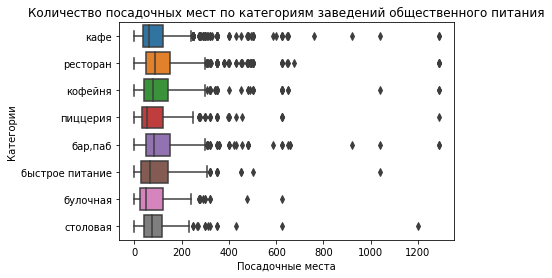

In [20]:
#построим диаграмму размаха для количества посадочных мест по категориям заведений 
ax = sns.boxplot(x='seats', y='category', data = df)
plt.title('Количество посадочных мест по категориям заведений общественного питания')
plt.xlabel('Посадочные места')
plt.ylabel('Категории');

Из-за выбросов значения посадочных мест, которые мы заметили еще в процессе предобработки, график не читаемый. Отбросим пропуски данных и посмотрим сколько посадочных мест мы можем отбросить. Для этого посчитаем 98 и 99 перцентили по количеству посадочных мест.

In [21]:
# отбросим пропущенные значения
df_seats = copy.deepcopy(df)
df_seats = df_seats.dropna()
df_seats.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4495 entries, 1 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               4495 non-null   object 
 1   category           4495 non-null   object 
 2   address            4495 non-null   object 
 3   district           4495 non-null   object 
 4   hours              4495 non-null   object 
 5   lat                4495 non-null   float64
 6   lng                4495 non-null   float64
 7   rating             4495 non-null   float64
 8   price              4495 non-null   object 
 9   avg_bill           4495 non-null   object 
 10  middle_avg_bill    4495 non-null   object 
 11  middle_coffee_cup  4495 non-null   object 
 12  chain              4495 non-null   object 
 13  seats              4495 non-null   float64
 14  street             4495 non-null   object 
 15  is_24/7            4495 non-null   object 
dtypes: float64(4), object(12

In [22]:
# посчитаем 95 и 99 перцентиль
np.percentile(df_seats['seats'], [98, 99])

array([480., 625.])

Видим, что 98% заведений имеют количество посадочных мест менее 480. Используем для построения диаграммы размаха, заведения, в которых посадочных мест менее 480. 

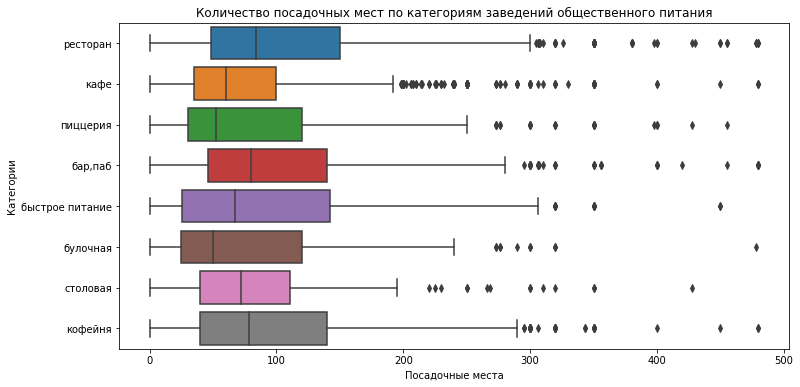

In [23]:
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='seats', y='category', data = df_seats.query('seats<=480'))
plt.title('Количество посадочных мест по категориям заведений общественного питания')
plt.xlabel('Посадочные места')
plt.ylabel('Категории');

Из получившейся диаграммы видно, что у пиццерии и булочной медиана находится примерно на одинаковом месте в районе 50 мест, чуть больше у кафе и заведений быстрого питания. Самая высокая медиана у ресторанов, баров, пабов и кофеен.   

### Рассмотрим соотношение сетевых и несетевых заведений в датасете

In [24]:
df_chain_and_not_chain = df.groupby('chain', as_index=False).agg({'name': 'count'})
df_chain_and_not_chain.columns = ['chain', 'count']
df_chain_and_not_chain

,chain,count
0,несетевое,5201
1,сетевое,3205


In [25]:
fig = px.pie(df_chain_and_not_chain, values = 'count', names = 'chain', title = "Соотношений сетевых и несетевых заведений")
fig.show()

В нашем датасете больше несетевых заведений (61.9%).

### Рассмотрим какие категории заведений чаще являются сетевыми

In [26]:
# сохраним данные сетевых заведений 
df_chain = df.query('chain =="сетевое"')
# сгруппируем сетевые объекты по категориям и отсортируем их по убыванию 
df_chain_group = df_chain.groupby('category', as_index=False).agg({'name':'count'})
df_chain_group.columns = ['category', 'count']
df_chain_group = df_chain_group.sort_values(by='count', ascending = False)
df_chain_group

,category,count
3,кафе,779
6,ресторан,730
4,кофейня,720
5,пиццерия,330
2,быстрое питание,232
0,"бар,паб",169
1,булочная,157
7,столовая,88


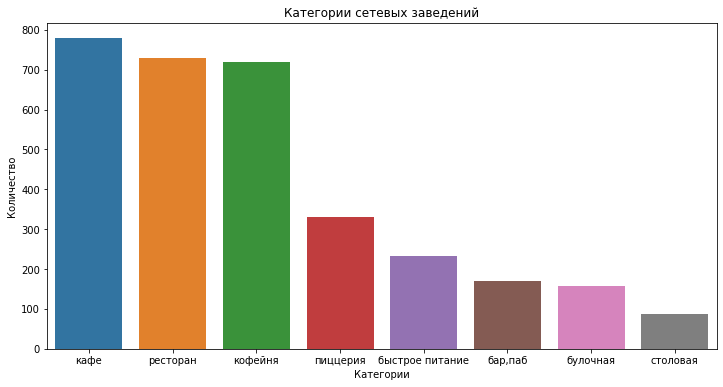

In [27]:
# построим столбчатую диаграмму
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='count', data = df_chain_group) 
plt.title('Категории сетевых заведений')
plt.xlabel('Категории')
plt.ylabel('Количество');

Самыми популярными категориями заведений среди сетевых являются кафе, на втором месте рестораны, а самым мало популярной категорией является столовая.

In [28]:
df_category_chain_or_not = df.groupby(['category', 'chain'], as_index=False).agg({'name':'count'})
df_category_chain_or_not.columns = ['category', 'chain', 'count']
df_category_chain_or_not = df_category_chain_or_not.sort_values(by='count', ascending=False)
df_category_chain_or_not

,category,chain,count
6,кафе,несетевое,1599
12,ресторан,несетевое,1313
7,кафе,сетевое,779
13,ресторан,сетевое,730
9,кофейня,сетевое,720
8,кофейня,несетевое,693
0,"бар,паб",несетевое,596
4,быстрое питание,несетевое,371
11,пиццерия,сетевое,330
10,пиццерия,несетевое,303


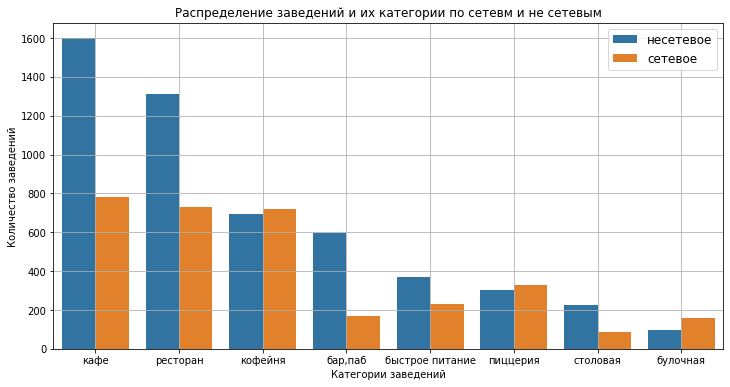

In [29]:
# построим график распределения количества заведений и их категорий по этим улицам
plt.figure(figsize=(12, 6))
ax=sns.barplot(x='category', y= 'count', data=df_category_chain_or_not, hue='chain')
plt.title('Распределение заведений и их категории по сетевм и не сетевым')
plt.xlabel('Категории заведений')
plt.ylabel('Количество заведений')

# выбирем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=12)
# добавим сетку
plt.grid()
# выведем график на экран
plt.show()

Из графика видно, что у заведений категорий булочная, кофейня и пиццерия сетевых заведений больше, чем не сетевых. У остальных категорий наоборот - несетевых заведений больше.

### Рассмотрим 15 самых популярных сетей города Москвы

#### Найдем самые популярные сетевые заведения

In [30]:
df_chain_top = df_chain.groupby('name', as_index=False).agg({'address':'count'})
df_chain_top.columns = ['name', 'count_chain']
df_chain_top = df_chain_top.sort_values(by='count_chain', ascending=False)
df_chain_top.head(15)

,name,count_chain
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
759,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39


Подозрительно выглядит заведение Хинкальная, есть вероятность, что это не сеть, а одноименные заведения. Изучим данные заведения поподробнее.

In [31]:
# отберем все сетевые заведения с именем Хинкальная  и сгруппируем их по категории заведения
df_check_chain = df_chain.query('name == "Хинкальная"')
df_check_chain_grouped =  df_check_chain.groupby('category').agg({'name':'count'})
df_check_chain_grouped

,name
category,
"бар,паб",3
быстрое питание,6
кафе,19
ресторан,15
столовая,1


Видим, что действительно у названия "Хинкальная" много категорий заведений, а не одна большая сеть. Очистим данные от Хинкальных и еще раз посмотрим на топ-15.

In [32]:
df_chain_top_correct = df_chain_top.query('name != "Хинкальная"')
df_chain_top_15 = df_chain_top_correct.head(15)
df_chain_top_15

,name,count_chain
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
759,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39
643,Теремок,38


Теперь можно заметить, что на 15 месте у нас появляется Drive Café с количеством заведений 24, так как больше всего Хинкальных было категории кафе (19 заведений), что меньше чем сеть Drive Café, то мы оставляем все как есть. 

In [33]:
# посторим круговую диаграмму по 15 самым популярным сетям 
fig = px.pie(df_chain_top_15, values='count_chain', names='name',
             title='15 самых популярных сетевых заведений общественного питания Москвы')
fig.update_traces(textposition='inside', textinfo='percent')
fig.show()

Из 15 самых популярных сетевых заведений общественного питания Москвы лидируют достаточно популярная сеть кофеен - Шоколадница (15.1%), далее следуют так же популярные пиццерии, в который есть и доставка - Домино'с (9.55%) и Додо пицца (9.3%). 

#### Отобразим  количество заведений каждой категории 

In [34]:
# сохраним данные о категориях топ-15 сетевых заведений в таблице
df_chain_first_row = df_chain.drop_duplicates(subset=['name'])
df_chain_category = df_chain_first_row['category'].value_counts()
df_chain_category

кафе               232
ресторан           173
кофейня            117
быстрое питание     76
бар,паб             61
пиццерия            49
столовая            34
булочная            20
Name: category, dtype: int64

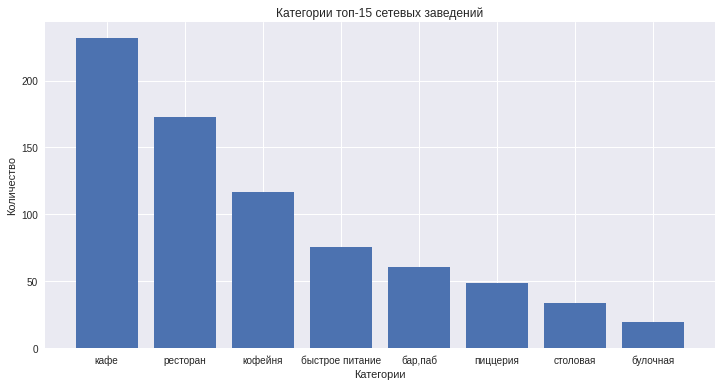

In [35]:
# посторим столбчаеую диаграмму по категориям 15 самых популярных сетей 
plt.style.use('seaborn') # выберем стиль диаграммы
plt.figure(figsize=(12, 6)) 
# сохраним данные df_chain_category в переменных
category = ['кафе', 'ресторан','кофейня', 'быстрое питание', 'бар,паб', 'пиццерия', 'столовая', 'булочная']
count = [232, 173, 117, 76, 61, 49, 34, 20]
plt.bar(category, count) 
plt.title('Категории топ-15 сетевых заведений')
plt.xlabel('Категории')
plt.ylabel('Количество');

Видим, что самым распространенной категорией заведения среди топ-15 сетей является кафе, на втором месте рестораны,что совпадает с показателями по всем сетевым заведениям, а вот последнее место уже отличается -  здесь это булочные, а, при рассмотрении всех сетевых заведений - столовые.  

#### Отобразим общее количество заведений и количество заведений каждой категории по районам.

Рассмортим сначала количество заведений топ-15 сетей каждой категории по районам. 

In [36]:
# создадим список с топ-15 сетевыми заведениями
list_top_15 = ["Шоколадница", "Домино'с Пицца","Додо Пицца", "One Price Coffee", "Яндекс Лавка", "Cofix", "Prime", 
               "Хинкальная","КОФЕПОРТ", "Кулинарная лавка братьев Караваевых", "Теремок", "Чайхана", "CofeFest", 
               "Буханка", "Му-Му" ]
# отберем данные только по топ-15 сетевым заведениям
df_chain_top_all_information = df_chain.query('name in @list_top_15')
df_chain_top_all_information.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,нет информации,нет информации,нет информации,нет информации,сетевое,180.0,Базовская улица,False
23,Буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,нет информации,нет информации,нет информации,нет информации,сетевое,NaN,Лобненская улица,False
32,Додо Пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,нет информации,Средний счёт:328 ₽,328.0,нет информации,сетевое,46.0,Коровинское шоссе,False
34,Домино'с Пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,нет информации,Средний счёт:от 500 ₽,500.0,нет информации,сетевое,247.0,Клязьминская улица,False
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,нет информации,нет информации,нет информации,нет информации,сетевое,NaN,улица Маршала Федоренко,False


In [37]:
# сгруппируем данные топ-15 сетей по районам и категориям
df_chain_district = df_chain_top_all_information.pivot_table(index='district', columns='category', values='name',
                                                             aggfunc='count')
df_chain_district['total'] = df_chain_district.sum(axis=1)
df_chain_district 

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Восточный административный округ,2.0,1.0,2.0,6.0,30.0,20.0,18.0,1.0,80.0
Западный административный округ,NaN,5.0,1.0,8.0,41.0,15.0,18.0,NaN,88.0
Северный административный округ,NaN,8.0,NaN,7.0,40.0,20.0,13.0,NaN,88.0
Северо-Восточный административный округ,NaN,6.0,2.0,6.0,37.0,19.0,15.0,NaN,85.0
Северо-Западный административный округ,NaN,3.0,2.0,1.0,20.0,13.0,7.0,NaN,46.0
Центральный административный округ,1.0,1.0,2.0,47.0,94.0,9.0,59.0,1.0,214.0
Юго-Восточный административный округ,NaN,NaN,2.0,12.0,15.0,16.0,11.0,NaN,56.0
Юго-Западный административный округ,1.0,1.0,1.0,9.0,25.0,16.0,17.0,NaN,70.0
Южный административный округ,NaN,NaN,NaN,4.0,34.0,23.0,28.0,NaN,89.0


In [38]:
# создадим функцию для построения графика распределения заведений по районам и типам
def district_and_category(data,title):
# сохраним категории и округа в отдельных списках
    districts = ['Восточный административный округ',
                 'Западный административный округ', 
                 'Северный административный округ',
                 'Северо-Восточный административный округ', 
                 'Северо-Западный административный округ', 
                 'Центральный административный округ', 
                 'Юго-Восточный административный округ',
                 'Юго-Западный административный округ', 
                 'Южный административный округ']
    categories = ['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']
    fig = px.bar(data, x=categories, y=districts, 
             title=title, text='value', width=1000, height=800)
    fig.show()

In [39]:
# применим функцию для построения столбчатой диаграммы
district_and_category(df_chain_district, 'Распределение топ-15 сетевых заведений по районам и типам')


Видим, что больше всего заведений топ-15 сетей в Центральном административном округе, там же больше всего ресторанов, кофеен и кафе. Меньше всего заведений в Северо-Западном административном округе.

Теперь рассмотрим распределение по районам и категориям среди всех сетевых заведений.

In [40]:
# сгруппируем данные всех сетевых заведений по районам и категориям заведений
df_chain_district_with_category = df_chain.pivot_table(index='district', columns='category', values='name',
                                                             aggfunc='count')
df_chain_district_with_category['total'] = df_chain_district.sum(axis=1)
df_chain_district_with_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Восточный административный округ,11,9,28,73,51,38,63,10,160.0
Западный административный округ,8,25,33,85,93,38,90,4,176.0
Северный административный округ,20,25,20,66,97,40,66,13,176.0
Северо-Восточный административный округ,18,18,27,83,79,36,61,12,170.0
Северо-Западный административный округ,2,10,13,35,34,22,37,3,92.0
Центральный административный округ,73,39,34,218,221,48,217,25,428.0
Юго-Восточный административный округ,10,5,23,80,29,29,41,3,112.0
Юго-Западный административный округ,11,15,30,80,50,38,72,6,140.0
Южный административный округ,16,11,24,59,66,41,83,12,178.0


In [41]:
# с помощью нашей функции построим график с распределением сеевых заведений по районам и категориям
district_and_category(df_chain_district_with_category, 'Распределение сетевых заведений по районам и типам')

Картина повторяется: здесь так же больше всего заведений в Центральном административном округе, а меньше всего в Северо-Западном административном округе. Но здесь уже появляется категория "бар, паб", которая практически не была заметна при рассмотрении топ-15, так как значения были слишком малы (всего 4 заведения). 

### Рассмотрим заведения с разбивкой по районам города Москвы

#### Найдем какие округа Москвы есть в датасете и рассмотрим как распределены заведения общественного питания в них

In [42]:
# сгруппируем данные по районам и посчитаем сколько заведений в каждом
df_district = df.groupby('district', as_index=False).agg({'name':'count'})
df_district.columns = ['district', 'total']
df_district = df_district.sort_values(by='total', ascending=False)
df_district

,district,total
5,Центральный административный округ,2242
2,Северный административный округ,900
8,Южный административный округ,892
3,Северо-Восточный административный округ,891
1,Западный административный округ,851
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


In [43]:
# построим круговую диаграмму с распределением заведений по районам Москвы
fig = px.pie(df_district, values = 'total', names = 'district', 
             title = 'Распределение заведений по районам города Москвы')
fig.show()

В датафрейме представлены данные по 9 округам Москвы, из которых больше всего заведений общественного питания в Центральном округе (26.7% или 2242 заведений), на втором месте, с отрывом более чем в 2 раза от лидера, Северный административный округ (10.7% или 900 зеведений), меньше всего заведений в Северо-Западном административном округе (4.87% или 409 заведений).

#### Отобразим общее количество заведений и количество заведений каждой категории по районам

In [44]:
#сгруппируем данные по районом и категориям
df_district_with_category = df.pivot_table(index='district', columns='category', values='name', aggfunc='count')
#добавим столбец с общим количеством
df_district_with_category['total'] = df_district_with_category.sum(axis=1)

df_district_with_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40,798
Западный административный округ,50,37,62,239,150,71,218,24,851
Северный административный округ,68,39,58,235,193,77,189,41,900
Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Южный административный округ,68,25,85,264,131,73,202,44,892


In [45]:
# построим диаграмму использую нашу функцию
district_and_category(df_district_with_category, 'Распределение заведений по типам и районам Москвы')

Центральный административный район лидирует не только по общему количеству заведений, но так же и всем категориям заведений. На последнем месте все так же Северо-Западный административный округ. Лидерство Центрально административного округа не случайно, центр Москвы не только туристический, но и бизнес центр, поэтому там сосредоточено основное количество заведений разных категорий и уровней цен. Кроме этого, центр Москвы живет еще и круглосуточно.

### Рассмотрим распределение средних рейтингов по категориям заведений

In [46]:
# рассмотрим данные, представленные в столбце 'rating'
df['rating'].describe()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Видим, что минимальная оценка - 1,а максимальная - 5, средняя и медиана практически равны (4,23 и 4,3 соотвественно), поэтому для анализа возьмем среднее значение. Так же можно отметить, что стандартное отклонение около 10% от максимального (0,47), а 75% оценок не превышают 4,4. 

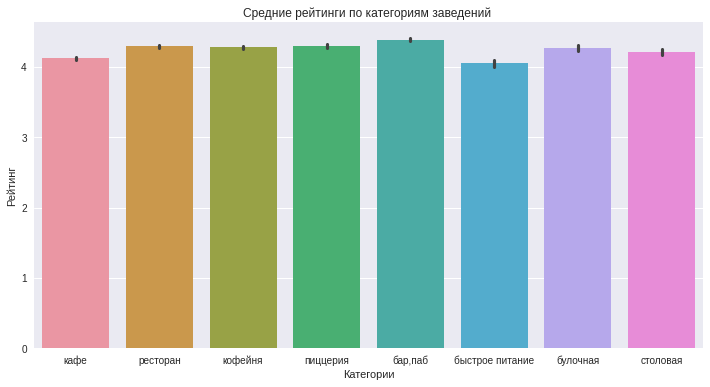

In [47]:
# построим столбчатую диаграмму по распределению средних оценок по категориям
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='rating', data=df)
plt.title('Средние рейтинги по категориям заведений ')
plt.xlabel('Категории')
plt.ylabel('Рейтинг');

Видно, что средний рейтинг представленных категорий заведений выше 4, что достаточно хорошо, лидером, с небольшим отрывом выступает категория "бар, паб", а самый невысокий рейтинг у заведений "быстрое питание". У всех категории заведений похожий рейтинг. Чтобы подробнее изучить средний рейтинг заведений построим "ящик с усами".

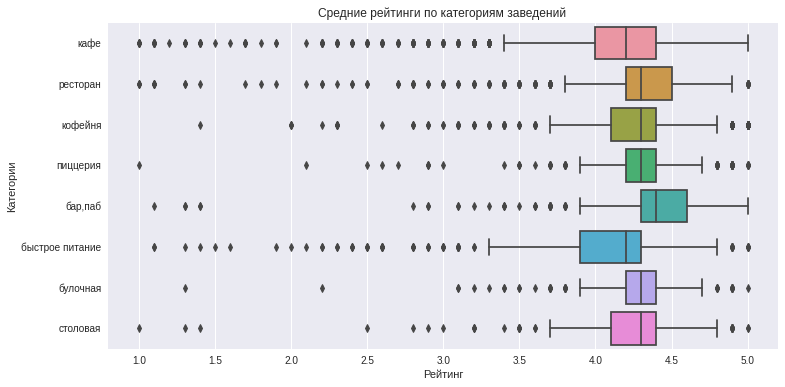

In [48]:
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='rating', y='category', data = df)
plt.title('Средние рейтинги по категориям заведений ')
plt.xlabel('Рейтинг')
plt.ylabel('Категории');

Диаграмма размаха подтверждает наши предыдущие выводы о том, что самый высокий медианный рейтинг у заведений категории паб, бар, при этом у данных заведений еще и самый высокий 3-й квартиль (примерно 4.6).

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [49]:
# сгруппируем данные по районам и среднему рейтингу заведений
df_mean_rating = df.groupby('district', as_index=False).agg({'rating':'mean'})
# переименуем столбцы
df_mean_rating.columns = ['district', 'mean_rating']
# округлим значения на 2 знаков после запятой
df_mean_rating['mean_rating'] = round(df_mean_rating['mean_rating'], 2)
df_mean_rating

,district,mean_rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [ ]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создадим карту 
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создадим хороплет и добавим его на карту
Choropleth(
    geo_data=state_geo,
    data=df_mean_rating,
    columns=['district', 'mean_rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выведем карту
m

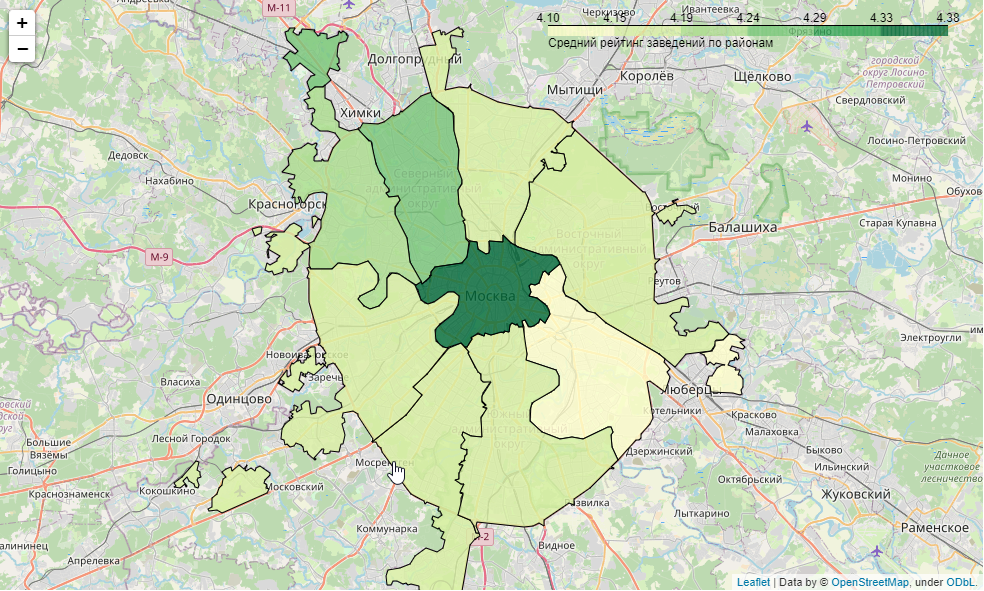

На харплете видно, что самый высокий средний рейтинг в Центральном автономном округе, а самый низкий в Юго-Восточном административном округе.	

### Отобразим все заведения датасета на карте 

In [ ]:
# для того чтобы отобразить все заведения на карте, воспользуется кластерами
# создадим карту 
map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создадим пустой кластер
marker_cluster = MarkerCluster().add_to(map)
# напишем функцию для создания маркера в текущей строке датафрейма и добавления кластера
def create_clusters(x):
    Marker(
    [x['lat'], x['lng']],
    popup=f"{x['name']}{x['rating']}",
    ).add_to(marker_cluster)
# применим функцию
df.apply(create_clusters, axis=1)
# выведем карту на экран
map

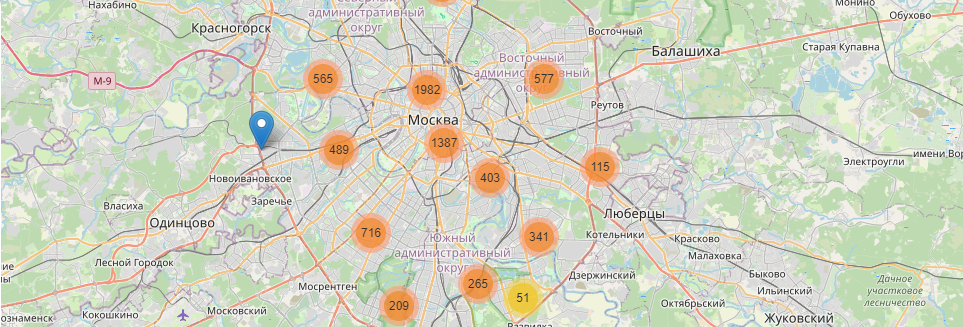

### Найдием топ-15 улиц по количеству заведений и рассмотрим распределение количества заведений и их категорий по этим улицам. 

In [52]:
# найдем топ-15 улиц по количеству заведений
df_streets = df.groupby('street', as_index=False).agg({'name':'count'})
df_streets.columns = ['street', 'count']
df_streets = df_streets.sort_values(by='count', ascending=False)
df_streets = df_streets.head(15)
df_streets

,street,count
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [53]:
# сохраним названия топ-15 улиц в списке
list_top_15_streets =  df_streets['street'].tolist()

# создадим переменную с информацией по топ-15 улицам
df_top_15_streets = df.query('street in @list_top_15_streets')
df_top_15_streets.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,нет информации,несетевое,79.0,Дмитровское шоссе,False
12,Заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,нет информации,несетевое,NaN,МКАД,False
17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,нет информации,несетевое,96.0,Ленинградское шоссе,True
26,Пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,нет информации,несетевое,NaN,Дмитровское шоссе,False
28,Mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,нет информации,несетевое,NaN,МКАД,False


In [54]:
# сгруппируем данные по улицам и категориям заведений
df_top_15_streets_with_category = df_top_15_streets.groupby(['street', 'category'], as_index=False).agg({'name':'count'})
df_top_15_streets_with_category.columns = ['street', 'category', 'count']


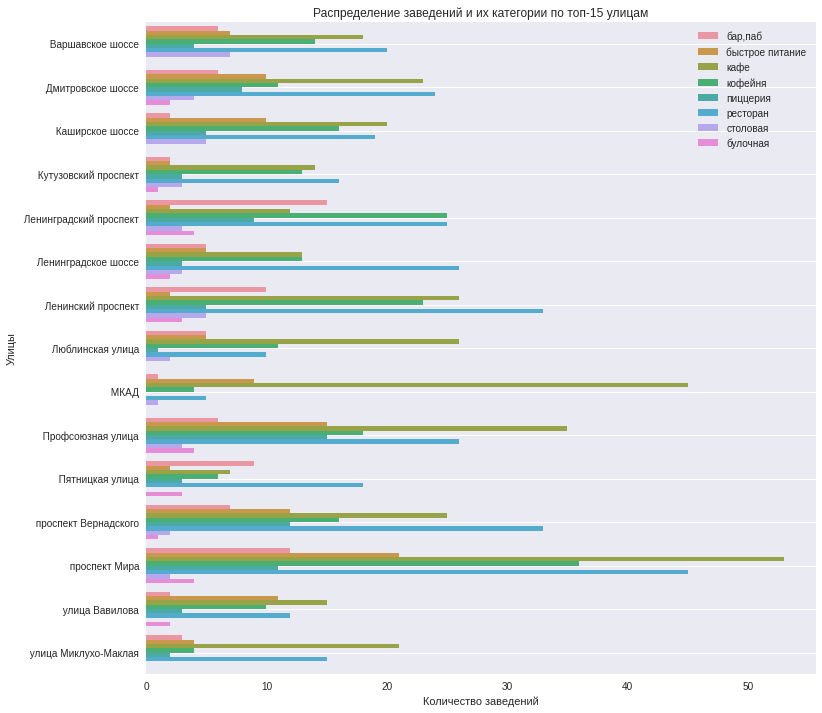

In [55]:
# построим график распределения количества заведений и их категорий по этим улицам
plt.figure(figsize=(12, 12))
ax=sns.barplot(x='count', y= 'street', data=df_top_15_streets_with_category, hue='category')
plt.title('Распределение заведений и их категории по топ-15 улицам')
plt.xlabel('Количество заведений')
plt.ylabel('Улицы')

# выбирем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=10)
# добавим сетку
plt.grid()
# выведем график на экран
plt.show()

Видим, что больше всего заведений из топ-15 улиц на проспекте Мира, меньше всего - на Пятницкой улице. По типу заведений на 9 улицах самым популярной категорией является кафе, в остальных - ресторан.

Показатели по МКАДу не удивительны, так как МКАД имеет протяженность 108 км и не удивительно, что на нем расположено так много заведений общественного питания. А вот, то что проспект Мира на первом месте обуславливается не только его длиной (8,9 км, хотя Ленинский проспект имеет большую длину, а количество заведений меньше), но и тем что на нем и в округе расположено много бизнес учреждений, консульств, а так же 5 станций метро и станция МЦК.

### Найдем улицы, на которых находится только один объект общепита

#### Отберем только улицы, на которых находится только одно заведение

In [56]:
# отфильтруем только улицы, на которых есть только одно заведение
df_streets_only_one = df.groupby('street', as_index=False).agg({'name':'count'})
df_streets_only_one.columns = ['street', 'count']
df_streets_only_one = df_streets_only_one.query('count == 1')
# сохраним значения столбца street в списке
list_streets_only_one = df_streets_only_one['street'].tolist()
# отберем данные только по интересующим нас улицам
df_only_one = df.query('street in @list_streets_only_one') 
df_only_one.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,нет информации,несетевое,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,нет информации,нет информации,нет информации,нет информации,несетевое,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,нет информации,нет информации,нет информации,нет информации,сетевое,NaN,парк Левобережный,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,нет информации,сетевое,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,нет информации,нет информации,нет информации,нет информации,сетевое,NaN,ландшафтный заказник Лианозовский,False


#### Определим к каким категориям относятся единственные на улице заведения

In [57]:
# сгруппируем заведения по категориям
df_only_one_grouped = df_only_one.groupby('category', as_index=False).agg({'name':'count'})
df_only_one_grouped.columns = ['category', 'count']
df_only_one_grouped = df_only_one_grouped.sort_values(by='count', ascending=False)
df_only_one_grouped

,category,count
3,кафе,160
6,ресторан,93
4,кофейня,84
0,"бар,паб",39
7,столовая,36
2,быстрое питание,23
5,пиццерия,15
1,булочная,8


In [58]:
# построим круговую диаграмму 
fig = px.pie(df_only_one_grouped, values = 'count', names = 'category', 
             title = 'Категории единственных на улице заведений')
fig.show()

Видим, что в основном это кафе, далее идут рестораны и совсем мало булочных, но это не показательно, т.к. по нашим данным в датафрейме больше всего как раз кафе и ресторанов.

#### Узнаем сколько у нас всего единственных на улице заведений

In [59]:
# посчитаем сколько всего единственных на улице заведений
print('Всего единственных на улице заведений:', sum(df_only_one_grouped['count']))

Всего единственных на улице заведений: 458


#### Рассмотрим среднюю цену в заведениях - единственных на улице

In [60]:
# рассмотрим средюю цену данных заведений
df_only_price = df_only_one.groupby('price', as_index=False).agg({'name':'count'})
df_only_price.columns = ['price', 'count']
df_only_price = df_only_price.sort_values(by='count', ascending=False)
df_only_price

,price,count
2,нет информации,276
4,средние,120
1,выше среднего,29
0,высокие,22
3,низкие,11


Видим, что у большинства заведений - единственных на улице, нет информации о средней цене. Построим диаграмму, без учета заведений, информация о цене в  которых, не известна.

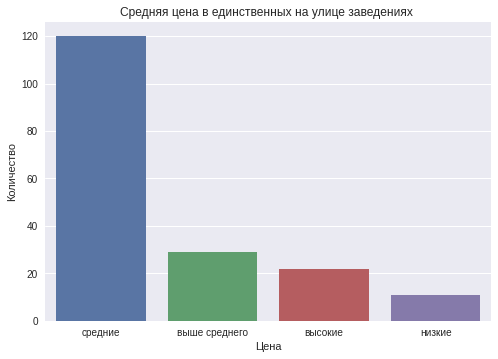

In [61]:
# очистим данные от заглушки "нет информации"
df_only_price = df_only_price.query('price!="нет информации"')
# построим столбчатую диаграмму по средней цене единственных на улице заведений 
ax = sns.barplot(x='price', y='count', data=df_only_price)
plt.title('Средняя цена в единственных на улице заведениях ')
plt.xlabel('Цена')
plt.ylabel('Количество');

Видим, что в основном цены в данных заведениях средние, на втором месте (с огромным отрывом) - цены выше среднего.

#### Рассмотрим районы, на улицах которых, расположено только одно заведение общепита

In [62]:
# рассмотрим районы, где засположены данные заведения
df_only_streets = df_only_one.groupby('district', as_index=False).agg({'name':'count'})
df_only_streets.columns = ['district', 'count']
df_only_streets = df_only_streets.sort_values(by='count', ascending=False)
df_only_streets

,district,count
5,Центральный административный округ,145
3,Северо-Восточный административный округ,55
0,Восточный административный округ,52
2,Северный административный округ,52
8,Южный административный округ,43
6,Юго-Восточный административный округ,39
1,Западный административный округ,35
4,Северо-Западный административный округ,19
7,Юго-Западный административный округ,18


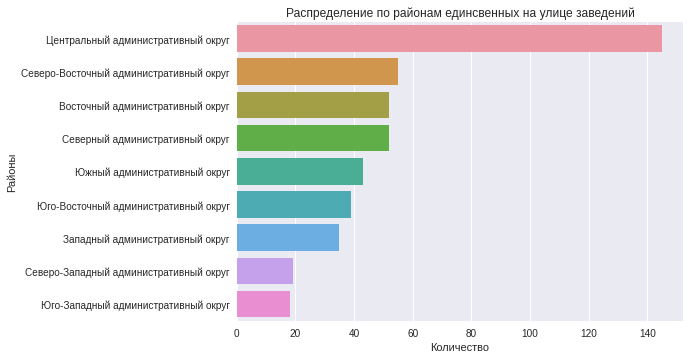

In [63]:
# построим столбчатую диаграмму по средней единственных на улице заведений 
ax = sns.barplot(x='count', y='district', data=df_only_streets)

plt.title('Распределение по районам единсвенных на улице заведений')
plt.xlabel('Количество')
plt.ylabel('Районы');

Больше всего единственных на улице заведений в Центральном административном округе, что не удивительно, так как в нем у нас больше всего заведений. Скорей всего улицы с одним заведением общественного питания появились либо на очень маленьких улицах, которых много в центре Москвы, либо в новых спальных районах, куда еще не успел прийти данный вид бизнеса.

#### Изучим посадочные места данных заведений

In [64]:
df_only_seats = df_only_one.groupby('seats', as_index=False).agg({'name':'count'})
df_only_seats.columns = ['seats', 'count']
df_only_seats = df_only_seats.sort_values(by='count', ascending=False)
df_only_seats.head()

,seats,count
23,40.0,18
17,30.0,13
28,48.0,9
25,45.0,6
0,0.0,6


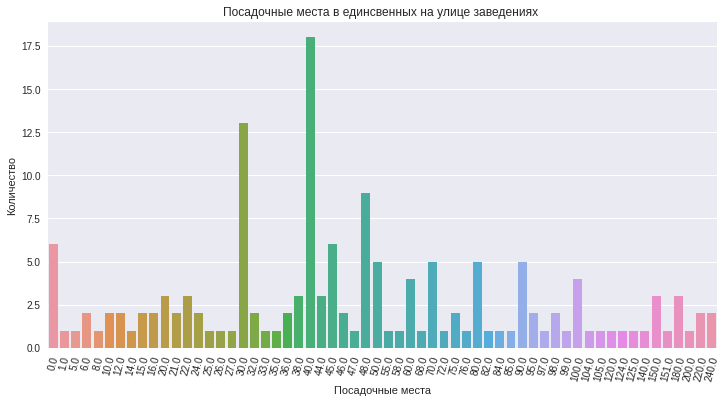

In [65]:
# построим столбчатую диаграмму 
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='seats', y='count', data=df_only_seats)
plt.title('Посадочные места в единсвенных на улице заведениях ')
plt.xlabel('Посадочные места')
plt.ylabel('Количество')
# повернем подписи значений по оси X на 75 градусов
plt.xticks(rotation=75);

Разброс по посадочным местам достаточно велик, но большинство заведений с 40 посадочными местами, на втором месте с 30 посадочными местами.

#### Рассмотрим время работы единственных на улице объектов

In [66]:
df_only_24_7 = df_only_one.groupby('is_24/7', as_index=False).agg({'name':'count'})
df_only_24_7.columns = ['is_24/7', 'count']
df_only_24_7 = df_only_24_7.sort_values(by='count', ascending=False)
df_only_24_7.head()

,is_24/7,count
0,False,400
1,True,31


In [67]:
# посмотрим как распределились данные по работе заведений по всем заведениям датафрейма
df_24_7 = df.groupby('is_24/7', as_index=False).agg({'name':'count'})
df_24_7.columns = ['is_24/7', 'count']
df_24_7

,is_24/7,count
0,False,7140
1,True,730


In [68]:
# построим круговые диаграммы по единственным заведениям на улице и по всему датафрейму
fig = px.pie(df_only_24_7, values = 'count', names = 'is_24/7', 
             title = 'Круглосуточное время работы единственных на улице заведений')
fig.show()

fig = px.pie(df_24_7, values = 'count', names = 'is_24/7', 
             title = 'Круглосуточное время работы заведений')
fig.show()

Из полученных данных видно, что в основном заведения не круглосуточные. На улицах с единственным заведением, круглосуточно работающих объектов общепита меньше чем во всем датафрейме примерно на 22%.

Подведем итоги, заведения - единственные на улице:
*  в основном кафе, далее идут рестораны и совсем мало булочных;
*  в основном цены в данных заведениях средние;
*  единственные на улице заведения расположены в основном в Центральном административном округе;
*  большинство данных заведений с 40 посадочными местами;
*  большинство заведений не работают круглосуточно.
В принципе, данные объекты не сильно отличаются от наших средних показателей: округ с самыми многочисленными заведениями - Центральный, самые популярные категории заведений - кафе и чуть менее - рестораны. Можно сделать вывод, что данные заведения не очень отличаются от других заведений в нашем датасете. Единственное, где есть более менее заметные отличия, это в количестве круглосуточно работающи заведений: на улицах с одним заведением их меньше чем во всем датафрейме на 22%, что позволяет предположить, что данные улицы расположены в спальных районах.

### Построим фоновую картограмму по значениям средних чеков заведений для каждого района. 

In [69]:
# для начала исключим данные, где нет информации 
df_middle_avg_bill = df.query('middle_avg_bill != "нет информации"')
# изменим тип данных столбца middle_avg_bill
df_middle_avg_bill= df_middle_avg_bill.astype({'middle_avg_bill':'int'})
# посчитаем медиану столбца middle_avg_bill для каждого района
df_district_middle_avg_bill = df_middle_avg_bill.groupby('district', as_index=False).agg({'middle_avg_bill':'median'})
df_district_middle_avg_bill.columns = ['district', 'median_bill']
df_district_middle_avg_bill = df_district_middle_avg_bill.sort_values(by='median_bill', ascending=False)
df_district_middle_avg_bill

,district,median_bill
1,Западный административный округ,1000
5,Центральный административный округ,1000
4,Северо-Западный административный округ,700
2,Северный административный округ,650
7,Юго-Западный административный округ,600
0,Восточный административный округ,575
3,Северо-Восточный административный округ,500
8,Южный административный округ,500
6,Юго-Восточный административный округ,450


In [ ]:
# постороим хароплет
# создадим карту 
map_district_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создадим хороплет и добавим его на карту
Choropleth(
    geo_data=state_geo,
    data=df_district_middle_avg_bill,
    columns=['district', 'median_bill'],
    key_on='feature.name',
    fill_color='PuBuGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(map_district_bill)

# выведем карту
map_district_bill

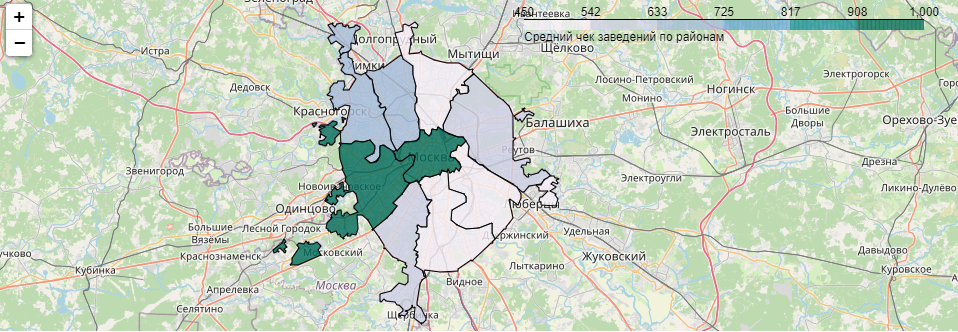

Самый высокий средний чек в Центральном  и Западном административных округах, а самый низкий в Юго-Восточном административном округе. По карте видно, на западе средний чек выше, чем на востоке.

**Вывод:**

Всего в датасете 8406 заведения общественного питания. 

Проведя анализ данных, можно отметить, что:
* что **больше всего заведений общественного питания категории кафе (28.3%), на втором месте рестораны (24.3%)**, меньше всего категории столовые (3.75%) и булочные (3.05%);
*  **98% заведений имеют количество посадочных мест менее 480**, при этом у пиццерии и булочной медиана находится примерно на одинаковом месте в районе 50 мест, **самая высокая медиана у ресторанов, баров, пабов и кофеен**; 
* в датасете **больше несетевых заведений** (61.9%);
* **сетевых заведений категорий булочная, кофейня и пиццерия больше, чем не сетевых**;
* **самыми популярными категориями заведений среди сетевых являются кафе**, на втором месте рестораны, меньше всего сетевых столовых;
* **из 15 самых популярных сетевых заведений** общественного питания Москвы **лидируют достаточно популярная сеть кофеен - Шоколадница** (15.1%), далее следуют так же популярные пиццерии, в который есть и доставка - Домино'с (9.55%) и Додо пицца (9.3%);
* **самым распространенной категорией заведения среди топ-15 сетей является кафе, на втором месте рестораны, что совпадает с показателями по всем сетевым заведениям**, а вот последнее место уже отличается - здесь это булочные, а, при рассмотрении всех сетевых заведений - столовые;
* **больше всего заведений топ-15 сетей в Центральном административном округе**, там же больше всего ресторанов, кофеен и кафе. Меньше всего заведений в Северо-Западном административном округе;
* **среди всех сетевых заведений так же больше всего заведений в Центральном административном округе**, а меньше всего в Северо-Западном административном округе, но здесь уже появляется категория "бар, паб", которая практически не была заметна при рассмотрении топ-15;
* в датафрейме представлены данные по 9 округам Москвы, из которых **больше всего заведений общественного питания в Центральном округе** (26.7%), на втором месте Северный административный округ (10.7%), **меньше всего заведений в Северо-Западном административном округе (4.87%)**.
* **самый высокий средний рейтинг в Центральном автономном округе**, а самый низкий в Юго-Восточном административном округе;
* **средний рейтинг представленных категорий заведений выше 4,** что достаточно хорошо, лидером, с небольшим отрывом выступает категория "бар, паб", а самый невысокий рейтинг у заведений "быстрое питание";
* больше всего заведений из топ-15 улиц на проспекте Мира, меньше всего - на Пятницкой улице. По типу заведений на 9 улицах самым популярной категорией является кафе, в остальных - ресторан;
* **самый высокий средний чек в Центральном и Западном административных округах**, а самый **низкий в Юго-Восточном административном округе**;
* **заведения - единственные на улице:**
    * категории - кафе, далее идут рестораны и совсем мало булочных;
    * со средними ценами;
    * расположены, в основном, в Центральном административном округе;
    * большинство с 40 посадочными местами;
    * большинство не работают круглосуточно. 
    * не сильно отличаются от средних показателей по всему датасету: округ с самыми многочисленными заведениями - Центральный, самые популярные категории заведений - кафе и чуть менее - рестораны. 


## Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.
Ответьте на следующие вопросы:
* Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
* Есть ли круглосуточные кофейни?
* Какие у кофеен рейтинги? Как они распределяются по районам?
* На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?


### Отберем данные о кофейнях в нашем датасете

In [71]:
# создадим переменную с данными только о кофейнях
df_coffee_house = df.query('category =="кофейня"')
print('В датасете:', len(df_coffee_house), 'кофеен')

В датасете: 1413 кофеен


### Проанализирем районы расположения кофеен

In [72]:
# найдем в каких районах расположены кофейни
df_coffee_house_district = df_coffee_house.groupby('district', as_index=False).agg({'name':'count'})
df_coffee_house_district.columns = ['district', 'count']
df_coffee_house_district = df_coffee_house_district.sort_values(by='count', ascending=False)
df_coffee_house_district

,district,count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


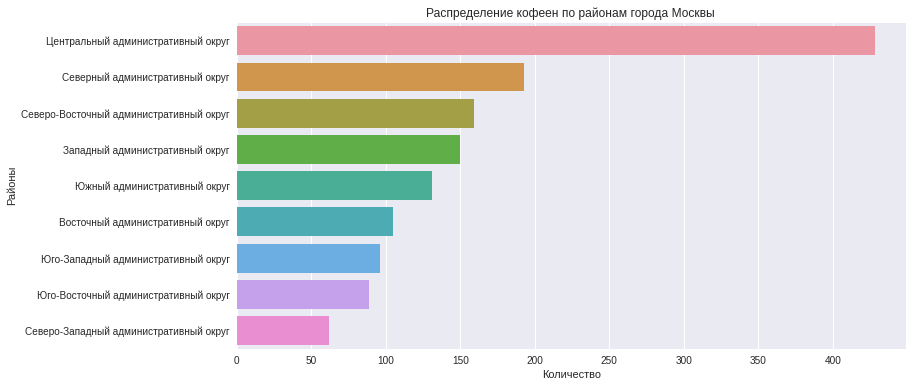

In [73]:
# построим столбчатую диаграмму 
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='count', y='district', data=df_coffee_house_district)
plt.title('Распределение кофеен по районам города Москвы ')
plt.xlabel('Количество')
plt.ylabel('Районы');

In [ ]:
# построим хороплет по расположению кофеен
# создадим карту 
map_coffee_house = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создадим хороплет и добавим его на карту
Choropleth(
    geo_data=state_geo,
    data=df_coffee_house_district,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Распределение кофеен по районам',
).add_to(map_coffee_house)

# выведем карту
map_coffee_house

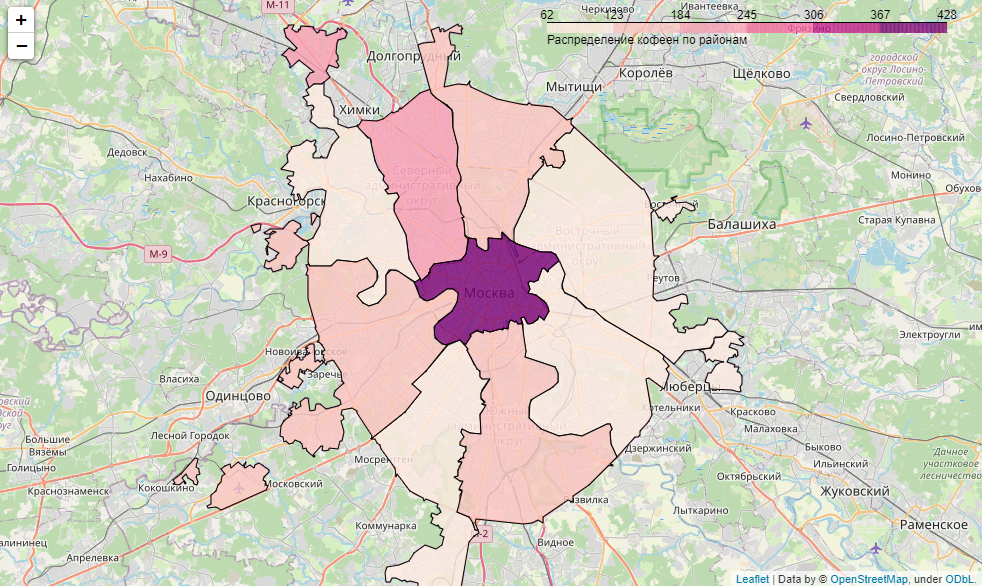

Больше всего кофеен в Центральном автономном округе, что ожидаемо, на втором месте, с отрывом более чем в 2 раза - Северный административный округ. Меньше всего в Северо-Западном административном округе.

### Рассмотрим время работы кофеен

#### Рассмотрим соотношение круглосуточных и не круглосуточных кофеен

In [75]:
df_coffee_house_is_24_7 = df_coffee_house.groupby('is_24/7', as_index=False).agg({'name':'count'})
df_coffee_house_is_24_7.columns = ['is_24/7', 'count']
df_coffee_house_is_24_7

,is_24/7,count
0,False,1339
1,True,59


In [76]:
fig = px.pie(df_coffee_house_is_24_7 , values = 'count', names = 'is_24/7', 
             title = 'Круглосуточное время работы кофеен', color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

Видим, что в основном, кофейни работают не круглосуточно, всего 4.22% круглосуточные.

#### Рассмотрим распределение круглосуточно работающих кофеен по регионам Москвы.

In [77]:
# переименуем столбец 'is_24/7' датафрейма df_coffee_house
df_coffee_house.columns = ['name', 'category', 'address', 'district', 'hours', 'lat', 'lng', 'rating', 'price', 'avg_bill',
 'middle_avg_bill', 'middle_coffee_cup', 'chain', 'seats', 'street', 'is_24']


In [78]:
# отберем данные по круглосуточно работающим кофейням
df_coffee_house_24_7_district = df_coffee_house.query('is_24 == True')
df_coffee_house_24_district = df_coffee_house_24_7_district.groupby('district', as_index=False).agg({'name':'count'})
df_coffee_house_24_district.columns = ['district', 'count']
df_coffee_house_24_district = df_coffee_house_24_district.sort_values(by='count', ascending=False)
df_coffee_house_24_district

,district,count
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


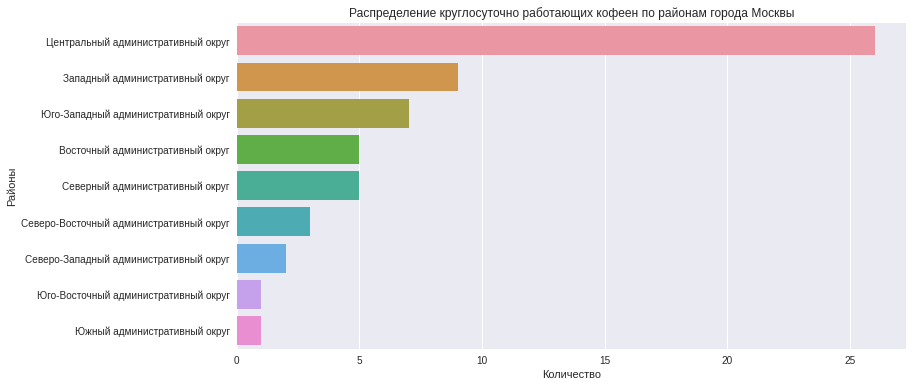

In [79]:
# построим столбчатую диаграмму 
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='count', y='district', data=df_coffee_house_24_district)
plt.title('Распределение круглосуточно работающих кофеен по районам города Москвы')
plt.xlabel('Количество')
plt.ylabel('Районы');

Видим, что больше всего круглосуточно работающих кофеен в Центральном АО, аменьше всего в Юго-Восточном АО и Южном АО. Это может быть связано с не востребованностью круглосуточно работающих заведений  в данных районах.

### Рассмотрим рейтинги кофеен и их распределение по районам

In [80]:
# посмотрим информацию о рейтингах кофеен
df_coffee_house['rating'].describe()

count    1413.000000
mean        4.277282
std         0.372250
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Минимальный рейтинг кофеен 1.4, максимальный 5, при этом более 25% кофеен имеют рейтинг выше 4.1. Среднее и медианное значения практически равны (4.28 и 4.3 соответсвенно), поэтому для расчета можно выбрать среднее значение.

In [81]:
df_coffee_house_rating = df_coffee_house.groupby('district', as_index=False).agg({'rating':'mean'})
df_coffee_house_rating.columns = ['district', 'mean_rating']
df_coffee_house_rating['mean_rating'] = round(df_coffee_house_rating['mean_rating'], 2)
df_coffee_house_rating = df_coffee_house_rating.sort_values(by='mean_rating', ascending=False)
df_coffee_house_rating

,district,mean_rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [ ]:
# построим хороплет по расположению кофеен
# создадим карту 
map_coffee_house_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создадим хороплет и добавим его на карту
Choropleth(
    geo_data=state_geo,
    data=df_coffee_house_rating,
    columns=['district', 'mean_rating'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.8,
    legend_name='Распределение кофеен по районам',
).add_to(map_coffee_house_rating)

# выведем карту
map_coffee_house_rating

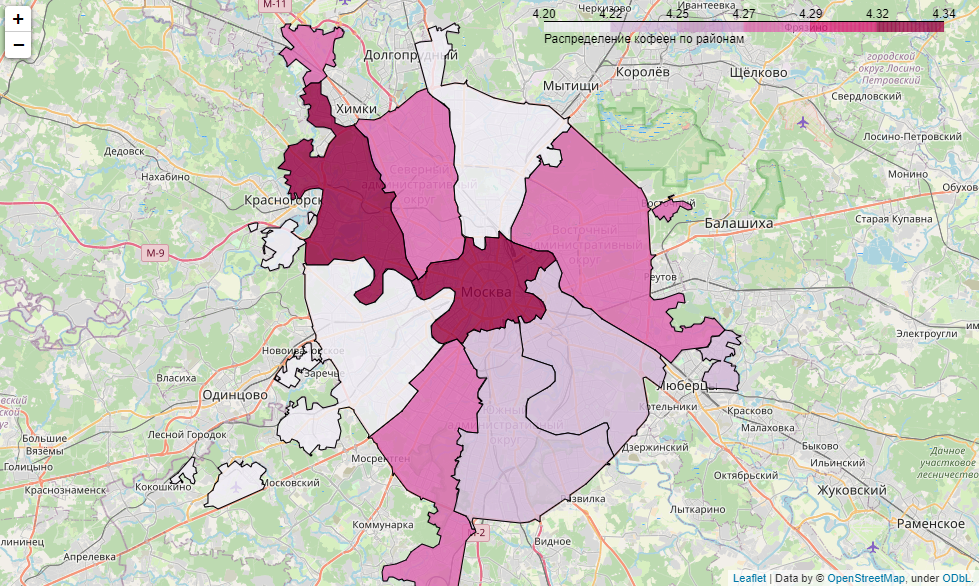

Кофейни с самым высоким рейтингом в Центральном и Северо-Западном административных округах, а с самым низким - в Северо-Восточном и Западном административных округах.

### Рассмотрим стоимость чашки капучино

In [83]:
# избавимся от заглушки "нет информации" в данных
df_coffee_house_coffee_cup = df_coffee_house.query('middle_coffee_cup !="нет информации"')
# изменим тип данных в столбце middle_coffee_cup
df_coffee_house_coffee_cup = df_coffee_house_coffee_cup.astype({'middle_coffee_cup':'int'})

In [84]:
df_coffee_house_coffee_cup['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Минимальная стоимость чашки капучино 60 рублей, максимальная 1568, стандартное квадротичное отклонение большое  - 89.75, средняя стоимость 175 руб., а медианная чуть ниже - 170 руб.. В 75% кофеен датасета цена чашки капучино не превышает 225 руб. Рассмотрим распределение стоиомсти чашки капучино в зависимости от района нахождения кофейни.

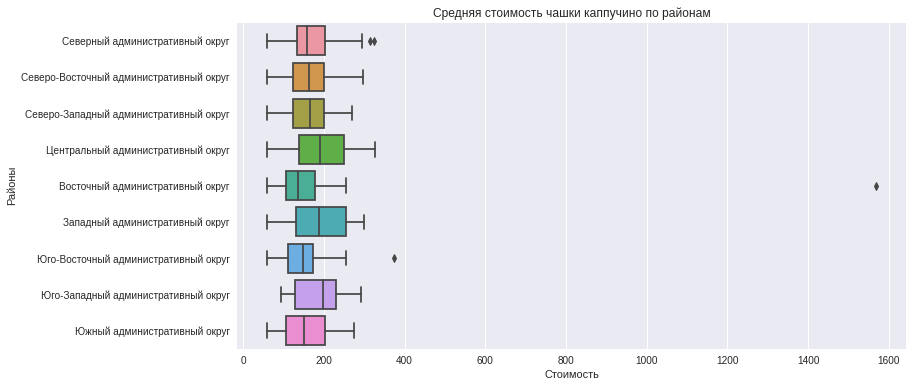

In [85]:
# построим боксплот по стоимости чашки капучино
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='middle_coffee_cup', y='district', data = df_coffee_house_coffee_cup)
plt.title('Средняя стоимость чашки каппучино по районам')
plt.xlabel('Стоимость')
plt.ylabel('Районы');

На диаграмме размаха видны выбросы на уровне 1500, для большей наглядности, построим диаграмму размаха для заведений, стоимость чашки капучина в которых, не привышает 400 рублей.

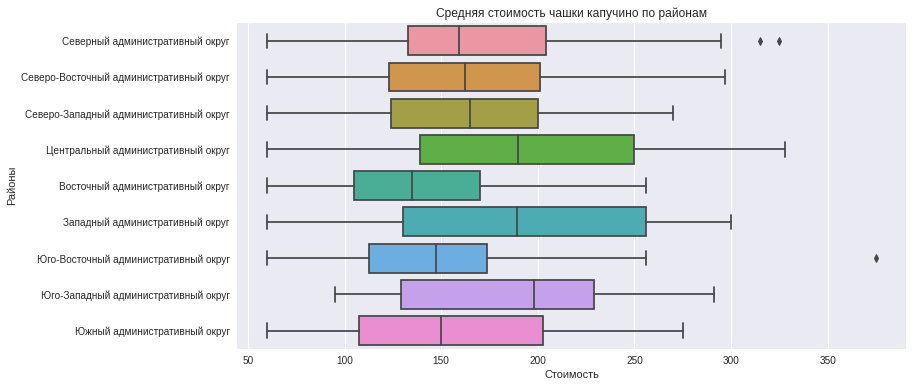

In [86]:
# построим боксплот по стоимости чашки капучино
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='middle_coffee_cup', y='district', data = df_coffee_house_coffee_cup.query('middle_coffee_cup<=400'))
plt.title('Средняя стоимость чашки капучино по районам')
plt.xlabel('Стоимость')
plt.ylabel('Районы');

По диаграмме размаха видно, что:
* самые высокие цены на чашку капучино в Центральном автономном округе;
* медиана в Центрально и Западном административных округах находятся на одном уровне около 190 руб.
* самые низкие цены в Восточном и Юго-Восточном автономных округах, приэтом медиана Восточного АО ниже чем у Юго-Восточного АО;
* медианая стоимость чашки капучино в Юго-Западном АО  самая высокая из всех районов.
* в 75% кофеен Центрально АО стоимость чашки капучино ниже 250 рублей. 

### Рассмотрим средний чек в кофейнях

In [87]:
# удалим заглушку и значение = 0
df_coffee_house_middle_avg_bill =  df_coffee_house.query('middle_avg_bill !="нет информации" and middle_avg_bill !=0')
# изменим тип данных
df_coffee_house_middle_avg_bill = df_coffee_house_middle_avg_bill.astype({'middle_avg_bill':'float'})
# рассмотрим информацию о среднем чеке
df_coffee_house_middle_avg_bill['middle_avg_bill'].describe()


count     199.000000
mean      617.296482
std       500.437342
min        50.000000
25%       300.000000
50%       400.000000
75%       750.000000
max      2500.000000
Name: middle_avg_bill, dtype: float64

Видим, что  минимальное значение среднего чека 50 рублей, максимальное 2500 рублей, среднее значение на 35% больше медианного (617,3 и 400 соответственно), поэтому для дальнейших расчетов будем использовать медианное значение, на которое не влияют выбросы.

In [88]:
df_coffee_house_median_avg_bill = df_coffee_house_middle_avg_bill.groupby('district', as_index=False)['middle_avg_bill'].median()
df_coffee_house_median_avg_bill.columns = ['district', 'median_avg_bill']
df_coffee_house_median_avg_bill = df_coffee_house_median_avg_bill.sort_values(by='median_avg_bill', ascending=False)
df_coffee_house_median_avg_bill

,district,median_avg_bill
1,Западный административный округ,600.0
5,Центральный административный округ,500.0
0,Восточный административный округ,400.0
8,Южный административный округ,387.5
7,Юго-Западный административный округ,375.0
2,Северный административный округ,325.0
3,Северо-Восточный административный округ,325.0
4,Северо-Западный административный округ,325.0
6,Юго-Восточный административный округ,250.0


In [89]:
# построим столбчатую диаграмму
fig = px.bar(df_coffee_house_median_avg_bill, x='median_avg_bill', y='district', 
             color_discrete_sequence=[px.colors.qualitative.Bold[0]], title='Распределение среднего чека кофеен по районам Москвы ')
fig.show();

По медиане среднего чека кофеен можно сказать, что самый высокий чек в кофейнях Западного АО, самый низкий в кофейнях Юго-Восточного АО. Проверим наши данные, построив диаграмму размаха.

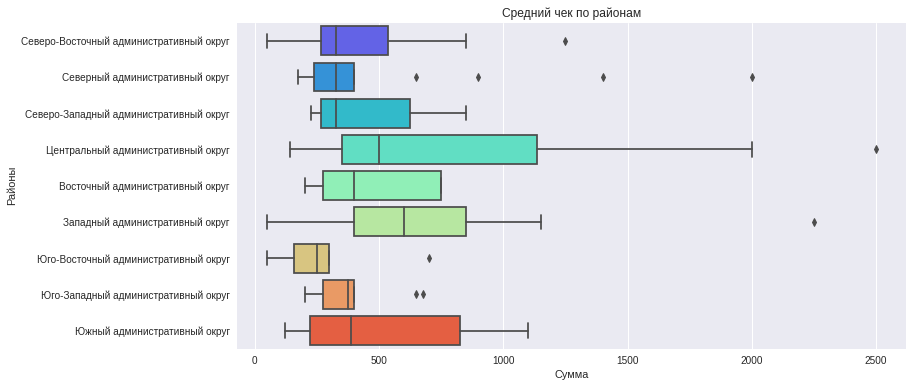

In [90]:
# построим теперь диаграмму размаха по средним чекам в кофейнях
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='middle_avg_bill', y='district', data = df_coffee_house_middle_avg_bill, palette='rainbow')
plt.title('Средний чек по районам')
plt.xlabel('Сумма')
plt.ylabel('Районы');

По диаграмме размаха видно, что медиана Западного АО самая высокая, а самые высокие показатели среднего чека в Центральном АО, при этом его медина 500 рублей, но зато у него же  самый большой 3-й квартиль и максимальная цена даже без выбросов.

**Вывод:**

Проведя анализ кофеен, можно сказть, что:
* больше всего кофеен в Центральном автономном округе, на втором месте Северный административный округ, а меньше всего в Северо-Западном административном округе;
* в основном, кофейни работают не круглосуточно, всего 4.22% круглосуточные.
* минимальный рейтинг кофеен 1.4, максимальный 5, при этом более 25% кофеен имеют рейтинг выше 4.1.
* кофейни с самым высоким рейтингом в Центральном и Северо-Западном административных округах, а с самым низким - в Северо-Восточном и Западном административных округах.
* самые высокие цены на чашку капучино в Центральном автономном округе, а самые низкие в Восточном и Юго-Восточном автономных округах, приэтом медиана Восточного АО ниже чем у Юго-Восточного АО;
* в 75% кофеен Центрально АО стоимость чашки капучино ниже 250 рублей;
* самый высокий средний чек в кофейнях Западного АО, самый низкий в кофейнях Юго-Восточного АО.

Подведя итог всему вышеизложенному, можно рекомендовать открыть кофейню: 
* в Северо-Восточном автономном округе, так как средний рейтинг кофеен, расположенных в данном районе, один из самых низких, поэтому будет проще с конкуренцией, если создать заведение на высоком уровне, хотя в данном районе уже достаточно много кафе;
* с некруглосуточной работой, хотя большинство кофеен и так работают не круглосуточно, но круглосуточная работа может окупиться только при размещении в Центральном АО и то не факт.
* стоимость чашки капучино не должна превышать 200 рублей (как у 75% всех заведений данного округа)
* средний чек не должен превышать 550 рублей (как у 75% заведений округа) .


## Презентация

Презентация: https://disk.yandex.ru/i/UhsU5_Mz5OH4Nw